In [87]:
%matplotlib inline
%load_ext autoreload
%autoreload 2
import os
import sys
p = os.path.join(os.path.dirname('__file__'), '..')
sys.path.append(p)
from common import *
from imutils.object_detection import non_max_suppression

import skimage
import itertools
import colorsys
from skimage.measure import find_contours
import matplotlib.patches as patches
import matplotlib.lines as lines
from matplotlib.patches import Polygon
import IPython.display
import matplotlib.pyplot as plt
from matplotlib import animation, rc
from IPython.display import HTML
from matplotlib.pyplot import Rectangle

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [93]:
DATA_DIR = '../data/'
json_fpath = os.path.join(DATA_DIR, 'volleyball_frame_00665.json')
img_fpath = os.path.join(DATA_DIR, 'volleyball_frame_00665.png')
IMG_DIR = os.path.join(DATA_DIR, 'volleyball', 'images_subset')
metadata_fpath = os.path.join(DATA_DIR, 'volleyball_bbox_labels.csv')
DETECTIONS_DIR = Path(DATA_DIR, 'volleyball', 'detections')
DETECTIONS_DIR.mkdir(exist_ok=True)
FIGSIZE=(16,16)

In [3]:
class_names = ['BG', 'person', 'bicycle', 'car', 'motorcycle', 'airplane',
               'bus', 'train', 'truck', 'boat', 'traffic light',
               'fire hydrant', 'stop sign', 'parking meter', 'bench', 'bird',
               'cat', 'dog', 'horse', 'sheep', 'cow', 'elephant', 'bear',
               'zebra', 'giraffe', 'backpack', 'umbrella', 'handbag', 'tie',
               'suitcase', 'frisbee', 'skis', 'snowboard', 'sports ball',
               'kite', 'baseball bat', 'baseball glove', 'skateboard',
               'surfboard', 'tennis racket', 'bottle', 'wine glass', 'cup',
               'fork', 'knife', 'spoon', 'bowl', 'banana', 'apple',
               'sandwich', 'orange', 'broccoli', 'carrot', 'hot dog', 'pizza',
               'donut', 'cake', 'chair', 'couch', 'potted plant', 'bed',
               'dining table', 'toilet', 'tv', 'laptop', 'mouse', 'remote',
               'keyboard', 'cell phone', 'microwave', 'oven', 'toaster',
               'sink', 'refrigerator', 'book', 'clock', 'vase', 'scissors',
               'teddy bear', 'hair drier', 'toothbrush']

valid_class_name = ['person']#, 'sports ball']

## Helpers

In [94]:
def plot_img(arr, fs=FIGSIZE, cmap='gray', title=None):
    plt.figure(figsize=fs)
    plt.imshow(arr, cmap=cmap)
    plt.title(title)
    plt.show()
    
def load_img(fpath):
    return plt.imread(fpath)

def load_cv2_img(fpath, w=None, h=None, colorspace=None):
    img = cv2.imread(fpath)
    if colorspace is not None:
        img = cv2.cvtColor(img, colorspace)
    if None not in [w,h]:
        img = cv2.resize(img, (w, h), interpolation=cv2.INTER_CUBIC)
    return img

def threshold_color(img, color, thresh, sigma=1.0):
    """
    color = [b, g, r] or [r,b,g] or [h,s,v]
    thresh = [b,g,r] margin allowed around color (1 per channel)
    """
    if isinstance(thresh, int):
        thresh = [thresh]*3
    thresh = np.array(thresh) * sigma
    min_color = np.array([color[0]-thresh[0], color[1]-thresh[1], 
                          color[2]-thresh[2]])
    max_color = np.array([color[0]+thresh[0], color[1]+thresh[1],
                          color[2]+thresh[2]])
    min_color[min_color < 0] = 0
    max_color[max_color > 255] = 255
    print("Min", min_color)
    print("Max", max_color)
    
    mask = cv2.inRange(img, min_color, max_color)
    result = cv2.bitwise_and(img, img, mask=mask)
    return mask, result

def get_color_of_pixel(fpath, x, y, colorspace='BGR'):
    rgb_img = load_cv2_img(img_fpath, colorspace=cv2.COLOR_BGR2RGB)
    hsv_img = load_cv2_img(img_fpath, colorspace=cv2.COLOR_BGR2HSV)
    
    rgb_colors = rgb_img[y,x,:]
    hsv_colors = hsv_img[y,x,:]
    bgr_colors = np.copy(rgb_colors[::-1])
    print ("BGR:", bgr_colors)
    print ("RGB:", rgb_colors)
    print ("HSV:", hsv_colors)
    
    # Plot to visualize
    img = np.copy(rgb_img)
    img[y-5:y+5:,x-5:x+5,:] = 255
    img[y,x,:] = 0
    
    if colorspace == 'BGR':
        return bgr_colors.tolist()
    if colorspace == 'RGB':
        return rgb_colors.tolist()
    return hsv_colors.tolist()

def get_hsv_value_of_bgr(bgr_color):
    print("BGR", bgr_color)
    bgr_color = np.uint8([[bgr_color]])
    hsv = cv2.cvtColor(bgr_color, cv2.COLOR_BGR2HSV)[0][0]
    print("HSV", hsv)
    return hsv

# Create color histograms representing average values among samples
def get_flattened_channels(imgs):
    chans = np.empty(shape=(1,3))
    for img in imgs:
        h,w,c = img.shape
        reshaped = img.reshape((h*w, c))
        chans = np.concatenate([chans, reshaped], axis=0)
        #print(reshaped.shape, chans.shape)
    return chans

def get_color_hist_dict(imgs, bins, ):
    chans = get_flattened_channels(imgs)
    bgr = ('b','g','r')
    hists = {
        'b':None,
        'g':None,
        'r':None
    }
    for i in range(len(chans[0])):
        hist, bins = np.histogram(chans[:,i], bins, [0,256])
        hists[bgr[i]] = hist
    return hists

def plot_hists_dict(hists):
    for col,hist in hists.items():
        plt.plot(hist, color=col)
    plt.show()
    
def get_color_hist(imgs, bins):
    chans = get_flattened_channels(imgs)
    hists = []
    for i in range(len(chans[0])):
        hist, bins = np.histogram(chans[:,i], bins, [0,256])
        hists.append(hist)
    return hists

def plot_hists(hists, title="None"):
    colors = ('r','g','b')
    for col,hist in zip(colors, hists):
        plt.plot(hist, color=col)
    plt.title(title)    
    plt.show()
    
def plot_bbs_from_rectLabel_annos(json_fpath, img_fpath):
    bb_json = json.load(open(json_fpath, 'r'))
    fig = plt.figure(figsize=FIGSIZE)
    axes = plt.axes([0, 0.03, 1, 0.97])
    
    img = plt.imread(img_fpath)
    imgplot = axes.imshow(img)

    for box in bb_json['objects']:
        label = box['label']
        color = BOX_COLORS[label]
        coords = box['x_y_w_h']
        bb = Rectangle(
            (coords[0],coords[1]), 
            coords[2], coords[3],
            fill=False,
            edgecolor=color,
            linewidth=2)
        axes.add_patch(bb)
        
def get_img_crops_from_rectLabel_bbs(img, json_fpath):
    crops_dict = {}
    bb_json = json.load(open(json_fpath, 'r'))
    for box in bb_json['objects']:
        label = box['label']
        x,y,w,h = box['x_y_w_h']
        crop = img[y:y+h,x:x+w,:]
        if label not in crops_dict:
            crops_dict[label] = []
        crops_dict[label].append(crop)
    return crops_dict

def make_boxes(meta):
    boxes = {}
    for idx,row in meta.iterrows():
        box = json.loads(row.to_json())
        fname = row['filename']
        if fname in boxes:
            boxes[fname].append(box)
        else:
            boxes[fname] = [box]
    return boxes

def median_filter(mask, ksize=3, thresh=25):
    median = cv2.medianBlur(mask, ksize)
    return median

def opening(img, ksize=(3,3)):
    # Erode --> Dilate
    erode_kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, ksize)
    dilate_kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, ksize)
    img = cv2.erode(img, erode_kernel, iterations = 1)
    img = cv2.dilate(img, dilate_kernel, iterations = 1)
    return img

def closing(img, ksize=(3,3)):
    # Dilate --> Erode
    erode_kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, ksize)
    dilate_kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, ksize)
    img = cv2.dilate(img, dilate_kernel, iterations = 1)
    img = cv2.erode(img, erode_kernel, iterations = 1)
    return img

def apply_bg_mask(fpaths, subtractor, limit=100, cleanup=None):
    i = 0
    masks = []
    for fpath in fpaths:
        img = load_cv2_img(fpath, colorspace=cv2.COLOR_BGR2RGB)
        fgmask = subtractor.apply(img)
        if cleanup == 'open':
            fgmask = opening(fgmask)
        elif cleanup == 'close':
            fgmask = closing(fgmask)
        elif cleanup == 'median':
            fgmask = median_filter(fgmask)
        fgmask[fgmask >= 2] = 255
        fgmask[fgmask < 2] = 0
        masks.append(fgmask)
        if i > limit:
            break
        i+=1
    return masks

def get_masked_imgs(fpaths, masks):
    imgs = []
    for fpath, mask in zip(fpaths, masks):
        img = load_cv2_img(fpath, colorspace=cv2.COLOR_BGR2RGB)
        img[mask == 0] = 255
        imgs.append(img)
    return imgs

def get_img_crop(img, x1, y1, x2, y2):
    if len(img.shape) > 2:
        return img[y1:y2,x1:x2,:]
    return img[y1:y2,x1:x2]

def plot_boxes(img, rects, title="boxes", color=(255,255,255), thick=2):
    for (x1, y1, x2, y2) in rects:
        cv2.rectangle(img, (x1, y1), (x2, y2), color, thick)
    plot_img(img, title=title)
    
    import random

def random_colors(N, bright=True):
    brightness = 1.0 if bright else 0.7
    hsv = [(i / N, 1, brightness) for i in range(N)]
    colors = list(map(lambda c: colorsys.hsv_to_rgb(*c), hsv))
    random.shuffle(colors)
    return colors

def apply_mask(image, mask, color, alpha=0.5):
    for c in range(3):
        image[:, :, c] = np.where(mask == 1,
                                  image[:, :, c] *
                                  (1 - alpha) + alpha * color[c] * 255,
                                  image[:, :, c])
    return image

def create_display_img(image, boxes, masks, class_ids, class_names, scores, ax=None):
    """
    boxes: [num_instance, (y1, x1, y2, x2, class_id)] in image coordinates.
    masks: [height, width, num_instances]
    class_ids: [num_instances]
    class_names: list of class names of the dataset
    scores: (optional) confidence scores for each box
    """
    # Number of instances
    N = boxes.shape[0]
    if not N:
        print("\n*** No instances to display *** \n")
    else:
        assert boxes.shape[0] == masks.shape[-1] == class_ids.shape[0]

    if ax is None:
        _, ax = plt.subplots(1, figsize=FIGSIZE)

    # Generate random colors
    colors = random_colors(N)
    
    masked_image = image.astype(np.uint32).copy()
    for i in range(N):
        color = (0.0, 1.0, 0.40000000000000036)# colors[i]

        # Bounding box
        if not np.any(boxes[i]):
            # Skip this instance. Has no bbox. Likely lost in image cropping.
            continue
        y1, x1, y2, x2 = boxes[i]
        p = patches.Rectangle((x1, y1), x2 - x1, y2 - y1, linewidth=2,
                              alpha=0.7, linestyle="dashed",
                              edgecolor=color, facecolor='none')
        ax.add_patch(p)

        # Label
        class_id = class_ids[i]
        score = scores[i] if scores is not None else None
        label = class_names[class_id]
        x = random.randint(x1, (x1 + x2) // 2)
        caption = "{} {:.3f}".format(label, score) if score else label
        ax.text(x1, y1 + 8, caption,
                color='w', size=11, backgroundcolor="none")

        # Mask
        mask = masks[:, :, i]
        masked_image = apply_mask(masked_image, mask, color)

        # Mask Polygon
        # Pad to ensure proper polygons for masks that touch image edges.
        padded_mask = np.zeros(
            (mask.shape[0] + 2, mask.shape[1] + 2), dtype=np.uint8)
        padded_mask[1:-1, 1:-1] = mask
        contours = find_contours(padded_mask, 0.5)
        for verts in contours:
            # Subtract the padding and flip (y, x) to (x, y)
            verts = np.fliplr(verts) - 1
            p = Polygon(verts, facecolor="none", edgecolor=color)
            ax.add_patch(p)

    return ax.imshow(masked_image.astype(np.uint8))

In [11]:
metadata = pd.read_csv(metadata_fpath)
metadata['label_name'] = 'ball'
metadata['label_id'] = 1
fnames = metadata['filename']
fpaths = [os.path.join(IMG_DIR, f) for f in fnames]
metadata['fpath'] = fpaths
GT_BOXES = make_boxes(metadata)

## Ground Truth Boxes

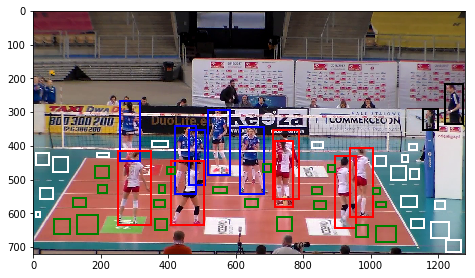

In [39]:
BOX_COLORS = {
    'referee': 'black',
    'red_team': 'red',
    'blue_team': 'blue',
    'court-inner': 'green',
    'court_outer': 'white',
}
json_fpath = os.path.join(DATA_DIR, 'volleyball_frame_00665.json')
img_fpath = os.path.join(DATA_DIR, 'volleyball_frame_00665.png')
plot_bbs_from_rectLabel_annos(json_fpath, img_fpath)
BINS = 20

In [40]:
def get_label_hists(label, crops, plot=False, bins=20):
    avg_hist = get_color_hist(crops, bins=bins)
    comb_hist = cv2.calcHist(
        crops, [0, 1, 2], None, [bins, bins, bins], 
        [0, 256, 0, 256, 0, 256])
    avg_norm_hist = cv2.normalize(comb_hist, comb_hist).flatten()
    if plot:
        plot_hists(avg_hist,title=label)
        plt.plot(avg_norm_hist)
        plt.show()
    return avg_hist, avg_norm_hist

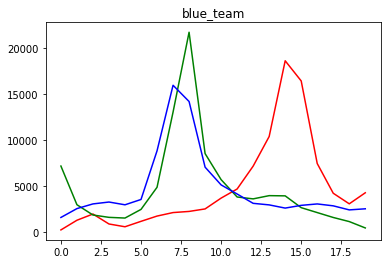

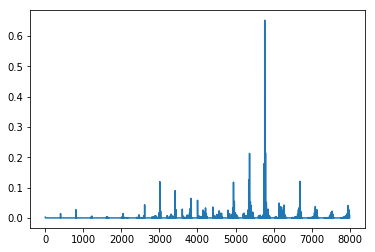

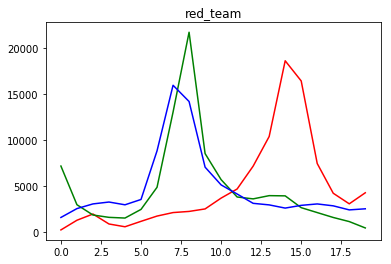

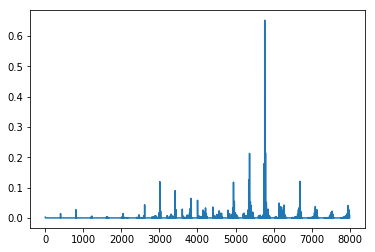

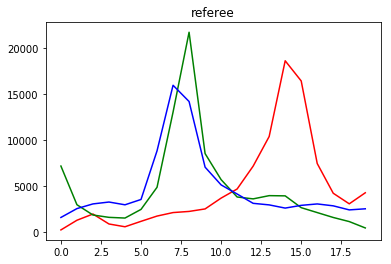

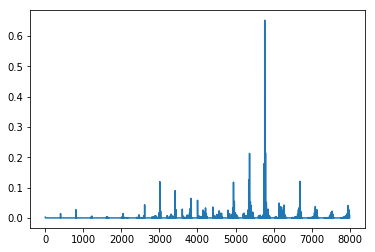

In [46]:
img = load_cv2_img(img_fpath, colorspace=cv2.COLOR_BGR2HSV)
all_crops = get_img_crops_from_rectLabel_bbs(img, json_fpath)
gt_labels = ['blue_team', 'red_team', 'referee']
specs = {label:{} for label in gt_labels}
for label in gt_labels:
    label_crops = all_crops[label]
    label_dims = []
    for crop in label_crops:
        label_dims.append(list(crop.shape[:2]))
    avg_hist,norm_hist = get_label_hists(label, crops, plot=True, bins=BINS)
    specs[label]['crops'] = label_crops
    specs[label]['dims'] = label_dims
    specs[label]['hist'] = avg_hist
    specs[label]['norm_hist'] = norm_hist

In [76]:
for label in gt_labels:
    dims = np.array(specs[label]['dims'])
    avg = np.mean(dims, axis=0)
    median = np.median(dims, axis=0)
    min_ = np.min(dims, axis=0)
    max_ = np.max(dims, axis=0)
    area = dims[:,0] * dims[:,1]
    aspect = dims[:,0] / dims[:,1]

    avg_area = np.mean(area)
    min_area = np.min(area)
    max_area = np.max(area)
    avg_aspect = np.mean(aspect)
    min_aspect = np.min(aspect)
    max_aspect = np.max(aspect)
    avg_width = np.mean(dims[:,0])
    avg_height = np.mean(dims[:,1])
    min_width = np.min(dims[:,0])
    min_height = np.min(dims[:,1])
    max_width = np.max(dims[:,0])
    max_height = np.max(dims[:,1])
    print(label, avg_area, min_area, max_area, "|", avg_aspect, min_aspect, max_aspect, "|", avg_width, avg_height, min_width,min_height,max_width,max_height)

blue_team 11437.6 7872 14112 | 3.07750140232 2.72222222222 3.41666666667 | 186.0 61.0 164 48 200 72
red_team 15663.8333333 10976 21879 | 2.80118101641 1.94845360825 3.51666666667 | 204.5 76.5 189 56 221 99
referee 4428.0 2772 6084 | 1.84090909091 1.43181818182 2.25 | 90.0 48.0 63 44 117 52


## Load Detections

In [84]:
detection_fpaths = [Path(fpath) for fpath in Path(DETECTIONS_DIR).glob('**/*.npy')]
detections = {}
for fpath in detection_fpaths:
    det = np.load(fpath)[0]
    det['img_fpath'] = fpath
    detections[fpath.name] = det

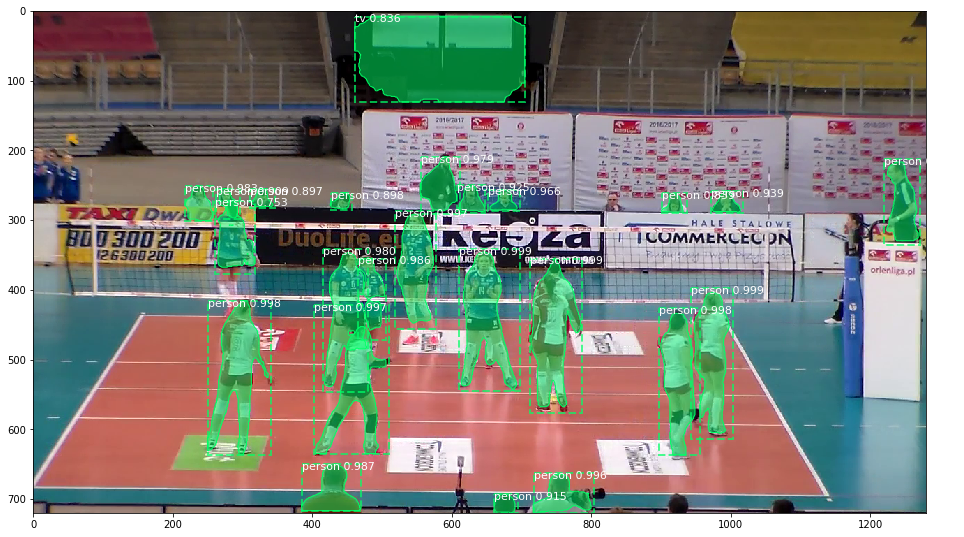

In [95]:
fpath = metadata['fpath'][0]
img = skimage.io.imread(fpath)
det_fpath = Path(DETECTIONS_DIR, Path(fpath).name + '.npy')
det = np.load(det_fpath)[0]
imgplot = create_display_img(
    img, det['rois'], det['masks'], det['class_ids'], 
    class_names, scores=det['scores'], ax=None
)

In [162]:
def draw_boxes(img, bbs, color=(0,255,0)):
    for (y1, x1, y2, x2) in bbs:
        cv2.rectangle(img, (x1, y1), (x2, y2), color, thickness=2)
    return img

In [103]:
fpath = metadata['fpath'][0]
img = skimage.io.imread(fpath)
det_fpath = Path(DETECTIONS_DIR, Path(fpath).name + '.npy')
det = np.load(det_fpath)[0]
bbs = det['rois']
img = draw_boxes(img, bbs)

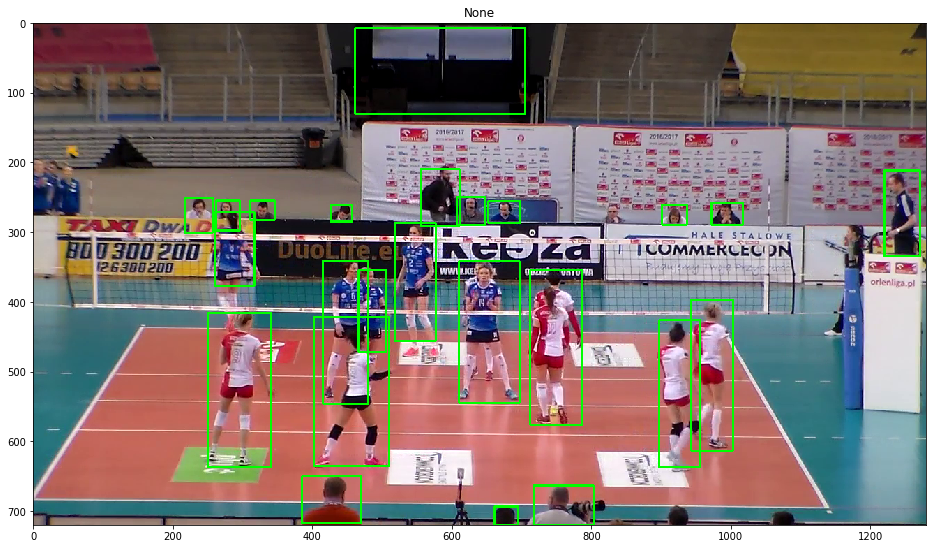

In [104]:
plot_img(img)

## Filter Boxes

### Get Background

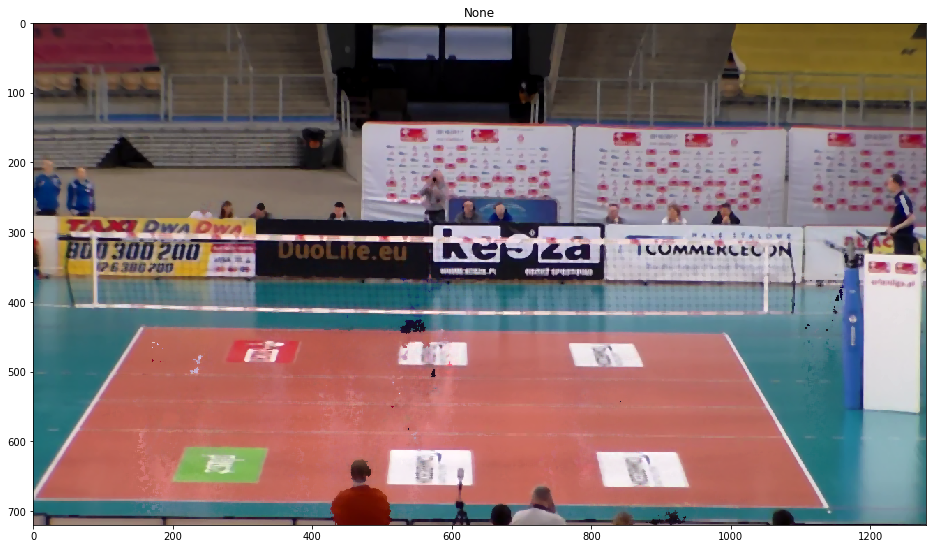

In [105]:
def segment_knn(fpaths, subtractor):
    for fpath in fpaths:
        img = load_cv2_img(fpath, colorspace=cv2.COLOR_BGR2RGB)
        fgmask = subtractor.apply(img)
    return subtractor.getBackgroundImage()

knn_subtractor = cv2.createBackgroundSubtractorKNN()
bg_img = segment_knn(metadata['fpath'], knn_subtractor)
bg_img = cv2.medianBlur(bg_img, 5)
plot_img(bg_img, fs=FIGSIZE)

### Segment Floor

BGR: [137 127  79]
RGB: [ 79 127 137]
HSV: [ 95 108 137]
Min [ 29.  77.  87.]
Max [ 129.  177.  187.]


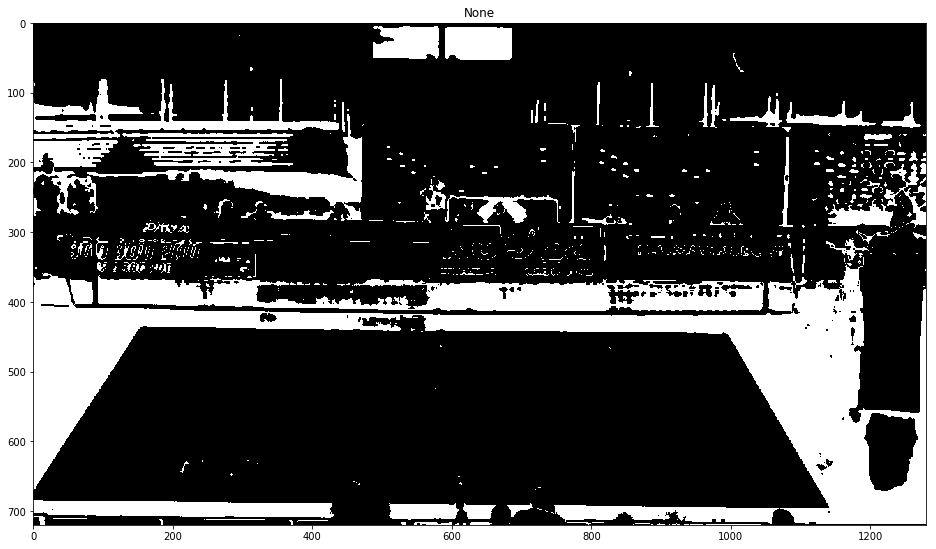

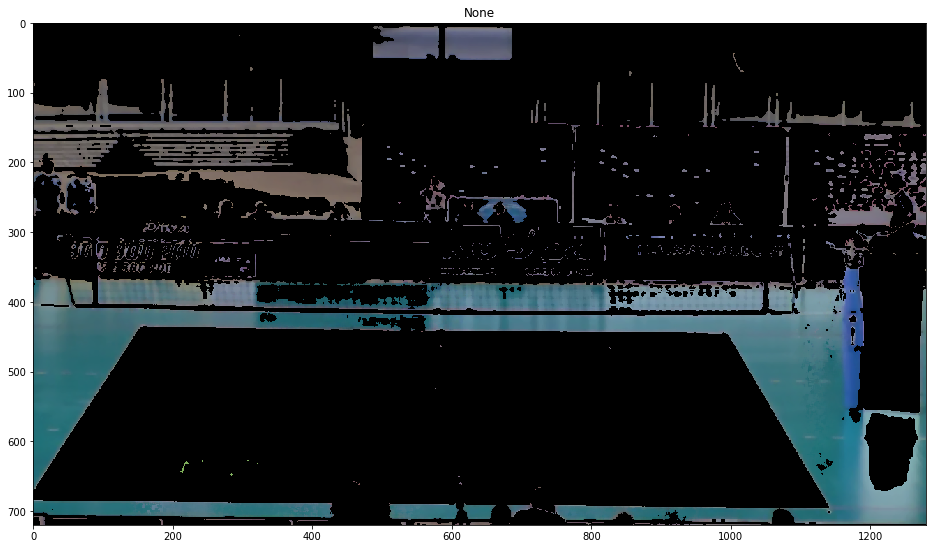

In [106]:
# Highlight floor around court (lighter green reflection)
img_fpath = metadata['fpath'][0]
color = get_color_of_pixel(img_fpath, 1130, 460, 'RGB')
mask, masked_img = threshold_color(bg_img, color, 50)
plot_img(mask)
plot_img(masked_img)

### Cleanup Masks

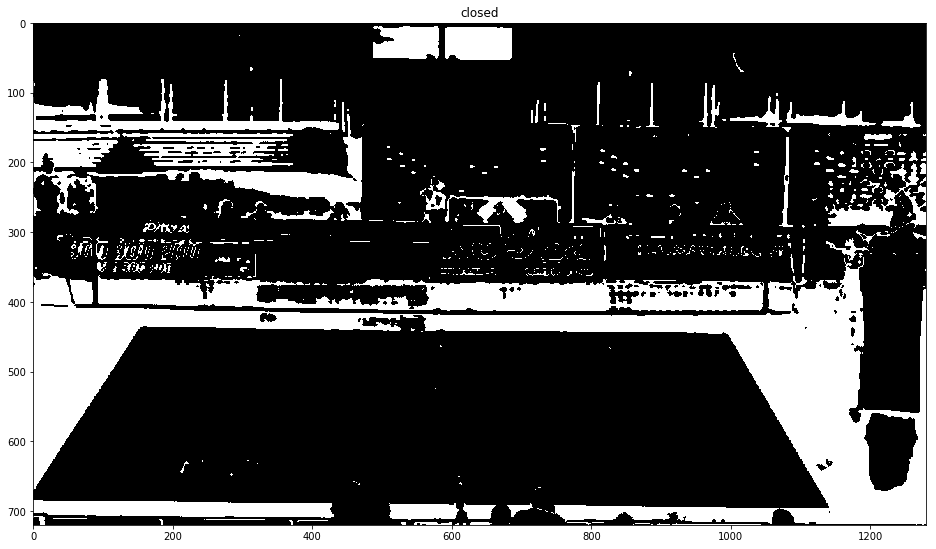

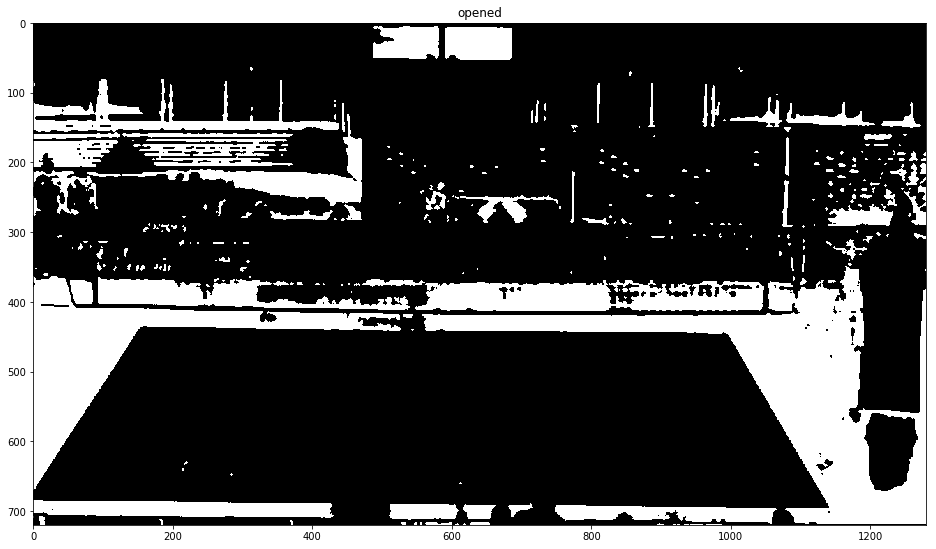

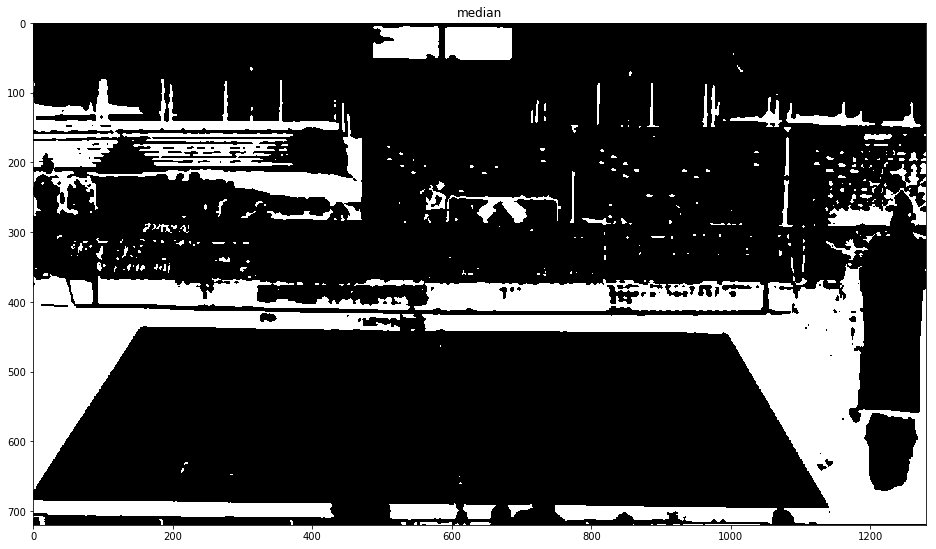

In [107]:
# img
closed_img = closing(mask, ksize=(3,3))
opened_img = opening(mask, ksize=(3,3))
median_img = median_filter(mask, ksize=3)

plot_img(closed_img, title='closed')
plot_img(opened_img, title='opened')
plot_img(median_img, title='median')

### Contours

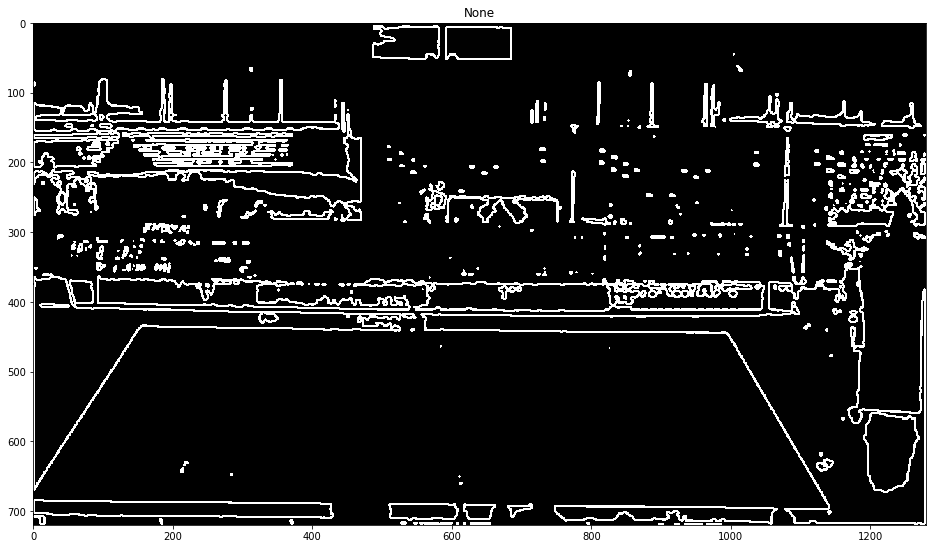

In [108]:
def get_contours(binary_mask):
    image, contours, hierarchy = cv2.findContours(binary_mask, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
    return contours, image

def plot_contours(img, contours, color=(255,255,255), thick=2):
    img = img.copy()
    img = cv2.drawContours(img, contours, -1, color, thickness=thick)
    plot_img(img)

contours, image = get_contours(median_img)
contours_img = median_img.copy()
_ = cv2.drawContours(contours_img, contours, -1, (255,255,255), thickness=2)
plot_img(contours_img)

### Hough Lines

In [109]:
# Higher threshold means a line needs to be stronger to be detected
thresh = 1000
img = contours_img
# what does theta control?
# what does the threshold do?
# what is rho?
lines = cv2.HoughLines(img, rho=1, theta=np.pi / 10, threshold=thresh)
# convert polor coordinates to x,y pixel coordinates
# origin (0,0) is top left in numpy/cv2
# p = distance from origin (perpendicular to hough line)
# theta = angle in radians formed by perpendicular line
coords = []
for line in lines:
    for rho, theta in line:
        degrees = theta * (180/math.pi)
        a = np.cos(theta)
        b = np.sin(theta)
        x0 = a * rho
        y0 = b * rho
        x1 = int(x0 + 1000 * -b)
        y1 = int(y0 + 1000 * a)
        x2 = int(x0 - 1000 * -b)
        y2 = int(y0 - 1000 * a)

        if degrees > 145:
            orient = 'right_vertical'
        elif degrees < 45:
            orient = 'left_vertical'
        elif degrees > 85 and degrees < 95:
            orient = 'horizontal'
        else:
            orient = 'other'
            
        coords.append([x1,y1,x2,y2,rho,theta,degrees,orient])

In [110]:
def plot_lines(img, coords):
    img = img.copy()
    for coord in coords:
        x1,y1,x2,y2,rho,theta,degrees,orient = coord
        cv2.line(img, pt1=(x1, y1), pt2=(x2, y2), color=(0, 255, 0), thickness=4)
    plot_img(img)

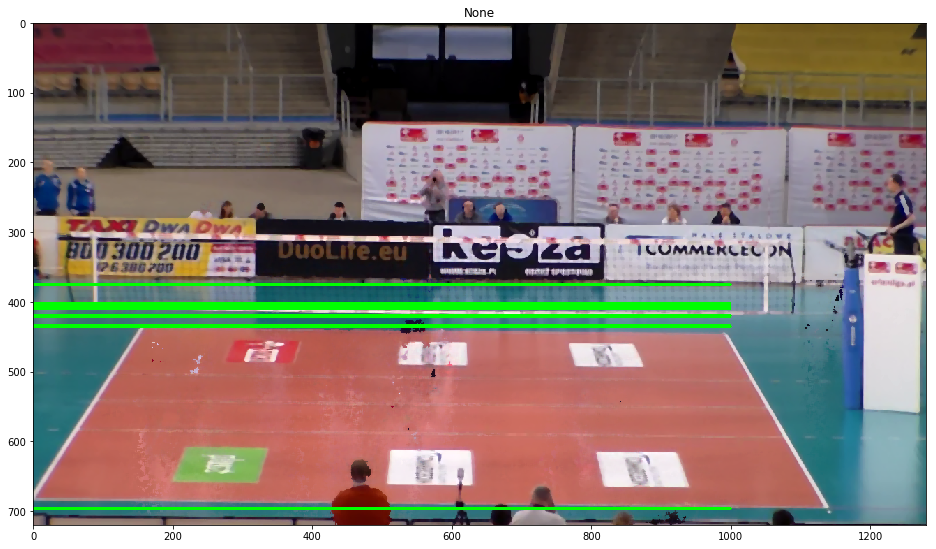

In [111]:
plot_lines(bg_img, coords)

### Get Upper/Lower Court Boundries

In [112]:
max_y,min_y = None,None
for coord in coords:
    #[x1,y1,x2,y2,rho,theta,degrees,orient])
    y = int((coord[1] + coord[3]) / 2)
    if max_y is None or y > max_y:
        max_y = y
        top_line = coord[:4]
    if min_y is None or y < min_y:
        min_y = y
        bottom_line = coord[:4]

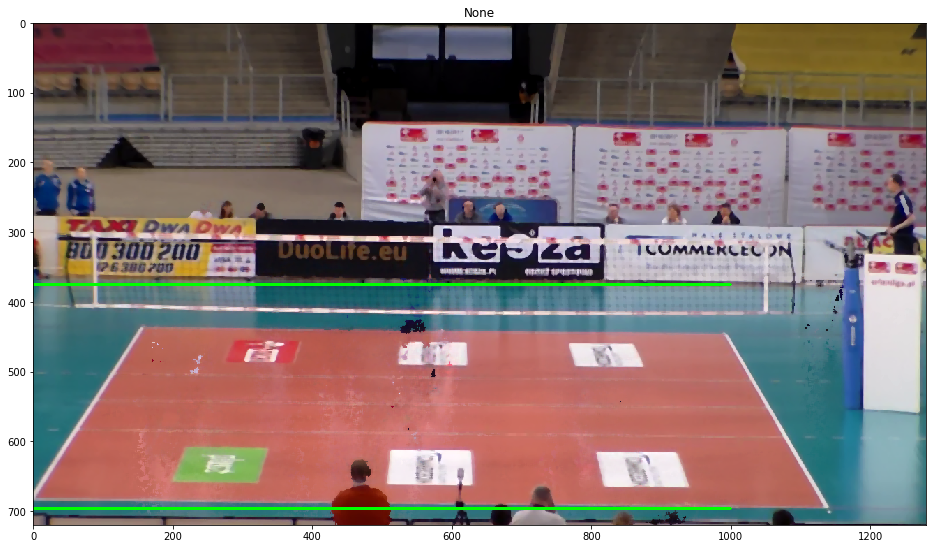

In [113]:
img = bg_img.copy()
x1,y1,x2,y2 = top_line
cv2.line(img, pt1=(x1, y1), pt2=(x2, y2), color=(0, 255, 0), thickness=4)
x1,y1,x2,y2 = bottom_line
cv2.line(img, pt1=(x1, y1), pt2=(x2, y2), color=(0, 255, 0), thickness=4)
plot_img(img)

In [215]:
TOP_COURT_Y = min_y
BOTTOM_COURT_Y = max_y

### Filter Boxes

In [114]:
def filter_bbs(bbs, min_y, max_y, margin=0):
    valid_bbs = []
    for bb in bbs:
        y1, x1, y2, x2 = bb
        if y2 < max_y and y2 > min_y:
            valid_bbs.append(bb)
    return valid_bbs

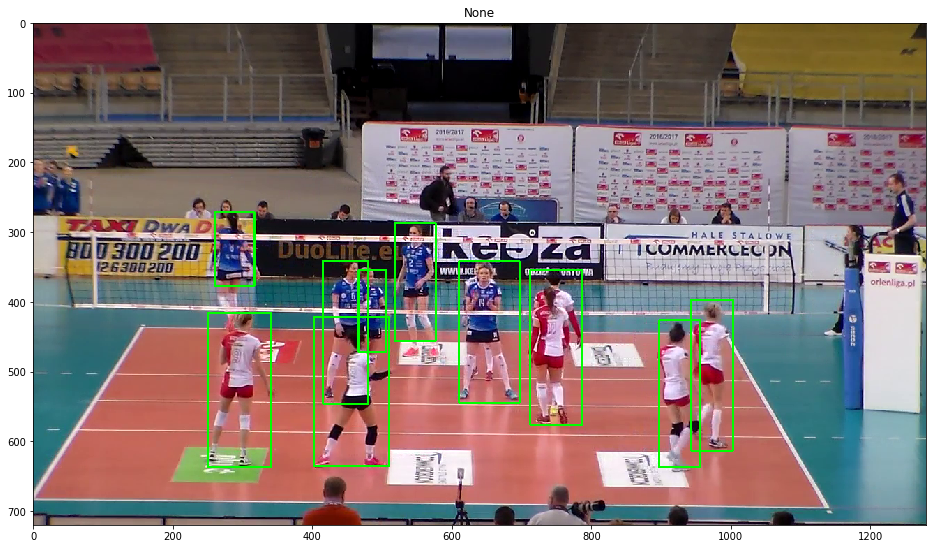

In [116]:
fpath = metadata['fpath'][0]
img = skimage.io.imread(fpath)
det_fpath = Path(DETECTIONS_DIR, Path(fpath).name + '.npy')
det = np.load(det_fpath)[0]
bbs = det['rois']
bbs = filter_bbs(bbs, min_y, max_y, margin=0)
img = draw_boxes(img, bbs)
plot_img(img)

## Load Homography

In [154]:
homography_path = Path(DATA_DIR, 'volleyball', 'inner_court_homography.npy')
floor_map_path = Path(DATA_DIR, 'volleyball', 'floormap.npy')
H = np.load(homography_path) # image to floor map
H_inv = np.linalg.inv(H) # floor map to image
floor_coords_fpath = Path(DATA_DIR, 'volleyball', 'floor_map_coords.npy')
floor_map_fpath = Path(DATA_DIR, 'volleyball', 'floor_map.npy')
floor_coords = np.load(floor_coords_fpath).reshape((1,))[0]
floor_map = np.load(floor_map_fpath)

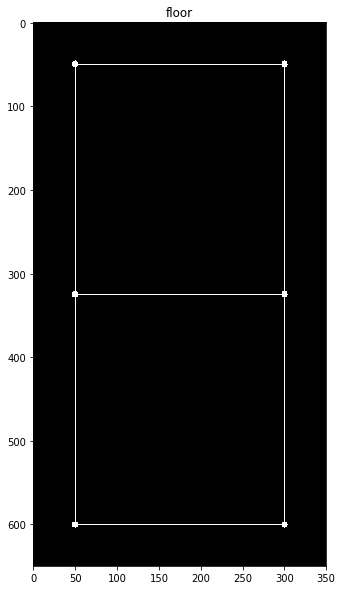

In [155]:
for point in floor_coords['floor_pts'].values():
    pt = point['x'],point['y']
    cv2.circle(floor_map, pt, 1, color=(255,255,255), thickness=5)
for line in floor_coords['inner_court_lines'].values():
    pt1 = (line['x1'],line['y1'])
    pt2 = (line['x2'],line['y2'])
    cv2.line(floor_map, pt1=pt1, pt2=pt2, 
             color=(255, 255, 255), thickness=1)
plot_img(floor_map, fs=(10,10), title="floor")

In [200]:
def map_point(point, H):
    pt = point.copy()
    pt.append(1)
    pt_arr = np.array([pt]).T
    map_pt = H @ pt_arr
    map_pt /= map_pt[2][0]
    map_pt = map_pt.astype(int).squeeze()[:2]
    print("Input:", pt, "Map:", map_pt)
    return map_pt[0],map_pt[1]
    
# Map Centers
center_left = map_point([floor_coords['floor_pts']['center_left']['x'], 
                        floor_coords['floor_pts']['center_left']['y']], H_inv)
center_right = map_point([floor_coords['floor_pts']['center_right']['x'], 
                          floor_coords['floor_pts']['center_right']['y']], H_inv)
center_left, center_right

Input: [50, 325, 1] Map: [ 89 538]
Input: [300, 325, 1] Map: [1055  549]


((89, 538), (1055, 549))

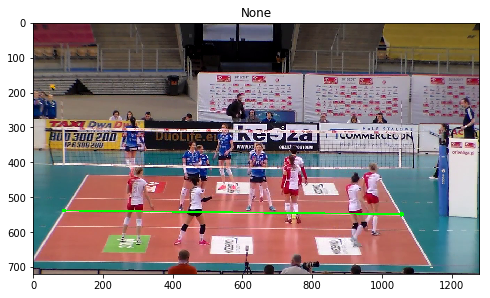

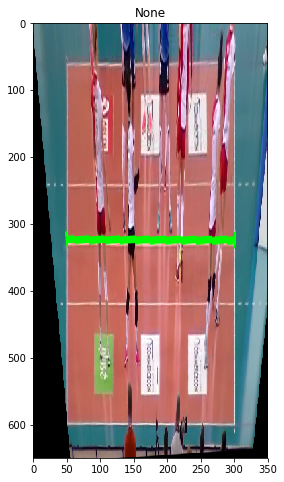

In [201]:
# PLot
fpath = metadata['fpath'][0]
img = load_cv2_img(fpath, colorspace=cv2.COLOR_BGR2RGB)
cv2.circle(img, (center_left[0], center_left[1]), 1, color=(0,255,0), thickness=10)
cv2.circle(img, (center_right[0], center_right[1]), 1, color=(0,255,0), thickness=10)
cv2.line(img, pt1=center_left, pt2=center_right, color=(0, 255, 0), thickness=3)
plot_img(img, fs=(8,8), title=None)

# Warp Image
im_dst = cv2.warpPerspective(img, H, dsize=(floor.shape[1],floor.shape[0]))
plot_img(im_dst, fs=(8,8))

# Looks like the center court line is around y = 542 ?
CENTER_COURT_LINE_Y = 550

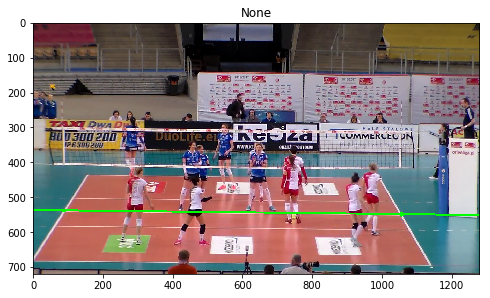

In [202]:
# Extend center line to edges
height, width, _ = img.shape
x1,y1 = center_left
x2,y2 = center_right

slope = (y2-y1) / (x2-x1)
b = y1 - slope * x1

# x intercepts
x1_int = int(-b / slope) # -b/m = 0 = mx + b), x when y == 0
x2_int = int((height - b) / slope) #x when y == height
# y intercepts
y1_int = int(b) #y when x == 0
y2_int = int(slope * width + b) #y when x == width

cv2.line(img, pt1=(0, y1_int), pt2=(width, y2_int), color=(0, 255, 0), thickness=3)
plot_img(img, fs=(8,8), title=None)

def get_center_court_line_y(x):
    return slope*x + b

## Team Classification

In [243]:
# Let's use the center court line to classify the players
def filter_bbs(bbs, min_y, max_y, margin=0):
    valid_bbs = []
    for bb in bbs:
        valid = True
        y1, x1, y2, x2 = bb
        if y2 > max_y or y2 < min_y:
            valid = False
        w = x2 - x1
        h = y2 - y1
        area = w * h
        if area > 30000 or area < 2000:
            valid = False
        if valid:
            valid_bbs.append(bb)
    return valid_bbs

def classify_teams(bbs, center_y, margin=0):
    red_team = []
    blue_team = []
    referee = []
    for bb in bbs:
        y1, x1, y2, x2 = bb
        avg_x = (x1 + x2) / 2
        center_y = get_center_court_line_y(avg_x) + margin
        if y2 <= center_y:
            blue_team.append(bb)
        else:
            red_team.append(bb)
    return red_team,blue_team

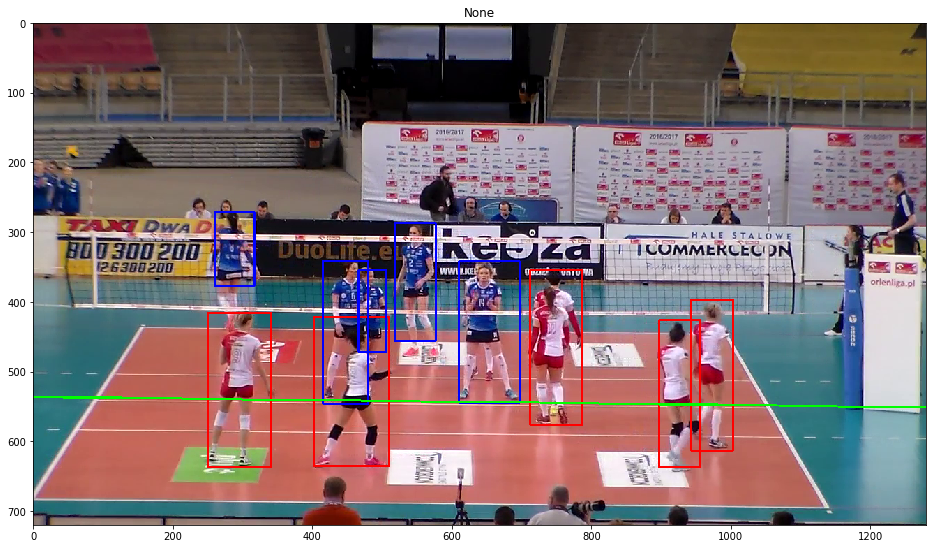

In [244]:
fpath = metadata['fpath'][0]
img = skimage.io.imread(fpath)
det_fpath = Path(DETECTIONS_DIR, Path(fpath).name + '.npy')
det = np.load(det_fpath)[0]
bbs = det['rois']
bbs = filter_bbs(bbs, min_y, max_y, margin=0)

red,blue = classify_teams(bbs, CENTER_COURT_LINE_Y, margin=10)
img = draw_boxes(img, red, color=(255,0,0))
img = draw_boxes(img, blue, color=(0,0,255))
cv2.line(img, pt1=(0, y1_int), pt2=(width, y2_int), color=(0, 255, 0), thickness=2)
plot_img(img)

## Player Tracking

In [245]:
def get_tracked_imgs(img_fpaths, limit=10):
    tracked_imgs = []
    for img_fpath in img_fpaths[:limit]:
        img = skimage.io.imread(img_fpath)
        det_fpath = Path(DETECTIONS_DIR, Path(img_fpath).name + '.npy')
        det = np.load(det_fpath)[0]
        bbs = filter_bbs(det['rois'], TOP_COURT_Y, BOTTOM_COURT_Y, margin=3)
        red,blue = classify_teams(bbs, CENTER_COURT_LINE_Y, margin=5)
        for (y1, x1, y2, x2) in red:
            cv2.rectangle(img, (x1, y1), (x2, y2), (255,0,0), thickness=2)
        for (y1, x1, y2, x2) in blue:
            cv2.rectangle(img, (x1, y1), (x2, y2), (0,0,255), thickness=2)
        tracked_imgs.append(img)
    return tracked_imgs

limit = 1320
imgs = get_tracked_imgs(fpaths, limit)

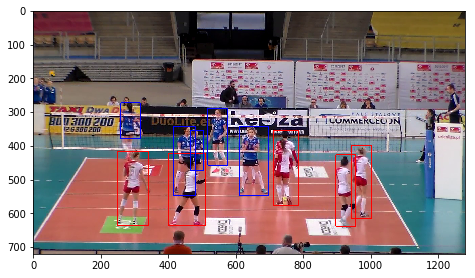

In [233]:
fig = plt.figure()
axes = plt.axes([0, 0.03, 1, 0.97])
img = imgs[0]
imgplot = axes.imshow(img, animated=True)
def init():
    return (imgplot,)

def animate(img):
    imgplot.set_array(img)
    return (imgplot,)

anim = animation.FuncAnimation(fig, animate, init_func=init,
                               frames=imgs, interval=30, blit=True)

In [231]:
# ~1 minute to generate
HTML(anim.to_html5_video())

## Detections Video

In [ ]:
fig, ax = plt.subplots(1, figsize=(16,16))
img = skimage.io.imread(metadata['fpath'][0])
imgplot = ax.imshow(img, animated=True)
def init():
    return (imgplot,)

def animate(fpath):
    ax.clear()
    img = skimage.io.imread(fpath)
    det_fpath = Path(DETECTIONS_DIR, Path(fpath).name + '.npy')
    det = np.load(det_fpath)[0]
    imgplot = create_display_img(
        img, det['rois'], det['masks'], det['class_ids'], 
        class_names, scores=det['scores'], ax=ax
    )
    return (imgplot,)

In [ ]:
anim = animation.FuncAnimation(fig, animate, init_func=init,
                               frames=metadata['fpath'][:300], interval=40, blit=False)

In [ ]:
# ~1 minute to generate
HTML(anim.to_html5_video())

## Save Video

In [235]:
# http://zulko.github.io/moviepy/getting_started/videoclips.html
from moviepy.editor import *

In [246]:
clip = ImageSequenceClip(imgs, fps=20)

In [247]:
outdir = Path(DATA_DIR, 'volleyball', 'player_tracking')
outdir.mkdir(exist_ok=True)
outfpath = str(Path(outdir, 'maskrcnn_w_homography.mp4'))
clip.write_videofile(outfpath)

[MoviePy] >>>> Building video ../data/player_tracking/maskrcnn_w_homography.mp4
[MoviePy] Writing video ../data/player_tracking/maskrcnn_w_homography.mp4


100%|██████████| 1320/1320 [00:11<00:00, 114.24it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: ../data/player_tracking/maskrcnn_w_homography.mp4 



## Links

* https://www.pyimagesearch.com/2015/11/16/hog-detectmultiscale-parameters-explained/
* https://www.learnopencv.com/histogram-of-oriented-gradients/
* https://www.learnopencv.com/image-recognition-and-object-detection-part1/
* https://github.com/BUPTLdy/human-detector
* https://www.pyimagesearch.com/2014/11/17/non-maximum-suppression-object-detection-python
* https://www.pyimagesearch.com/2015/11/16/hog-detectmultiscale-parameters-explained/
* http://lear.inrialpes.fr/people/triggs/pubs/Dalal-cvpr05.pdf
* http://mccormickml.com/2013/05/09/hog-person-detector-tutorial/
* https://www.learnopencv.com/histogram-of-oriented-gradients/
* https://stackoverflow.com/questions/34985196/opencv-using-svm-and-hog-for-person-detection
* https://www.pyimagesearch.com/2015/11/09/pedestrian-detection-opencv/